In [1]:
%pylab inline

import spacy
import pandas as pd
import numpy as np
import string
import matplotlib.pyplot as plt
from collections import Counter
import seaborn as sns
from wordcloud import WordCloud, ImageColorGenerator
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import pyLDAvis.sklearn
from unidecode import unidecode
from unicodedata import normalize
import statsmodels.api as sm

# Define default stopwords list
nlp = spacy.load('pt_core_news_sm')
stoplist = spacy.lang.pt.stop_words.STOP_WORDS
punctuations = string.punctuation

# Let's using Nate's Silver 538 style for graphs
plt.style.use('fivethirtyeight')

# Load data from local environment
df_extracted_essays = pd.read_csv('df_extracted_essays.csv')

# Basic information about the files
print(f'Qty Articles: {df_extracted_essays.shape[0]}')
print(f'Qty Distinct Authors: {len(df_extracted_essays.author.unique())}')

Populating the interactive namespace from numpy and matplotlib
Qty Articles: 2860
Qty Distinct Authors: 495


In [2]:
df_extracted_essays.head(10)

,author,url,date_transform,date,text_processed
0,Jeffrey Tucker,https://mises.org.br/Article.aspx?id=17,"['', '24', 'jan', '2008']",2008-01-24,propriedade intelectual chave sucesso maiores ...
1,Walter Block,https://mises.org.br/Article.aspx?id=19,"['', '30', 'jan', '2008']",2008-01-30,economista feliz 0 0 44 320 tdblockquotemurray...
2,Christopher Westley,https://mises.org.br/Article.aspx?id=22,"['', '30', 'jan', '2008']",2008-01-30,loucuras fiscais chegamos anos gastanca inflac...
3,Ron Paul,https://mises.org.br/Article.aspx?id=23,"['', '30', 'jan', '2008']",2008-01-30,crise imobiliaria politica monetaria federal r...
4,Jim Bradley,https://mises.org.br/Article.aspx?id=24,"['', '30', 'jan', '2008']",2008-01-30,culpem emprestadores subprime atual retorica c...
5,Lew Rockwell,https://mises.org.br/Article.aspx?id=25,"['', '30', 'jan', '2008']",2008-01-30,contratos governamentais versus negocios verda...
6,Jeffrey Tucker,https://mises.org.br/Article.aspx?id=26,"['', '30', 'jan', '2008']",2008-01-30,quao livre livre mercado consegue perceber err...
7,Gary Danelishen,https://mises.org.br/Article.aspx?id=27,"['', '30', 'jan', '2008']",2008-01-30,economia austriaca vs economia bernanke econom...
8,Ron Paul,https://mises.org.br/Article.aspx?id=28,"['', '30', 'jan', '2008']",2008-01-30,colapso enron perante comite servicos financei...
9,Art Carden,https://mises.org.br/Article.aspx?id=30,"['', '30', 'jan', '2008']",2008-01-30,expansao credito investimentos improdutivos co...


In [3]:
df_extracted_essays['text_processed'].head(1)[0]

'propriedade intelectual chave sucesso maiores tragedias referentes leis propriedade intelectual geram confusao empresarios sucedidos impressao apesar verdade fortuna direito autoral marca registrada patente necessariamente avaliacao negocios razao defendem propriedade intelectual fosse verdadeira forca vital negocios deixam credito principal motivo propria criatividade disposicao assumir riscos acoes geralmente baseadas mercado frequentemente julgamento empiricamente incorreto deles gera tragedia credito realizacoes verdade devidas proprias atividades empreendedoras fato faltam historias prontas conduzem falsa impressao inumeros relatos negocios mencionam lucros surgem patentes delas assumem causal suposicao historia espirito empreendedor deixa historia heroica riscos recompensas torna historia decisoes escriturarios patentes advogados direitos autorais resultado muitas pessoas acham razao eua terem crescido rapidamente seculo xix protecao propriedade intelectual assumem protecao idei

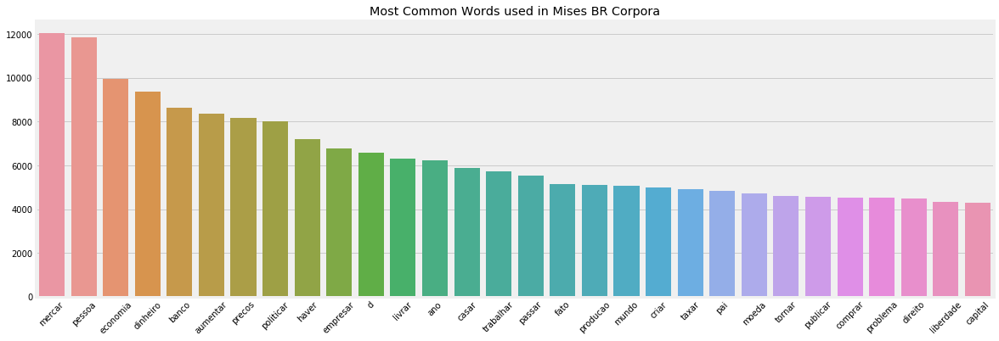

In [4]:
# Word Frequency per Category
def cleanup_text(docs, logging=False):
    texts = []
    counter = 1
    for doc in docs:
        if counter % 1000 == 0 and logging:
            print("Processed %d out of %d documents." % (counter, len(docs)))
        counter += 1
        doc = nlp(doc, disable=['parser', 'ner'])
        tokens = [tok.lemma_.lower().strip() for tok in doc if tok.lemma_ != '-PRON-']
        tokens = [tok for tok in tokens if tok not in stoplist and tok not in punctuations]
        tokens = ' '.join(tokens)
        texts.append(tokens)
    return pd.Series(texts)

df_text = [str(text) for text in df_extracted_essays['text_processed']]
df_text_clean = cleanup_text(df_text)
df_text_clean = ' '.join(df_text_clean).split()
df_text_clean_counts = Counter(df_text_clean)
df_common_words = [word[0] for word in df_text_clean_counts.most_common(31)]
df_common_counts = [word[1] for word in df_text_clean_counts.most_common(31)]
df_common_words.pop(0)
df_common_counts.pop(0)

fig = plt.figure(figsize=(18,6))
sns.barplot(x=df_common_words, y=df_common_counts)
plt.title(f'Most Common Words used in Mises BR Corpora')
plt.xticks(rotation=45)
plt.show()

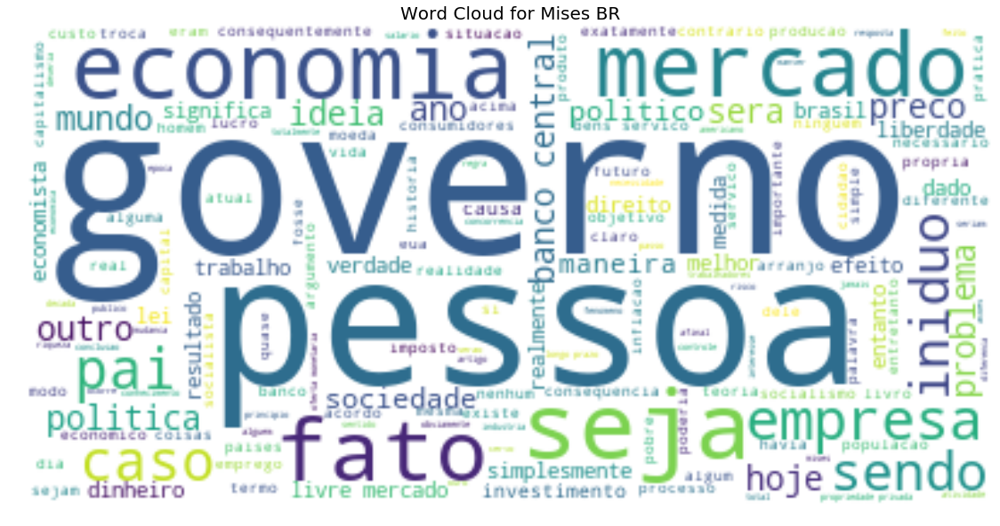

In [5]:
# Word cloud with most common words
def show_wordcloud(text):
    # Create and generate a word cloud image:
    wordcloud = WordCloud(stopwords=stoplist, background_color="white").generate(text)

    # Display the generated image:
    fig = plt.figure(figsize=(25,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Mises BR', fontsize=20)
    plt.axis("off")
    plt.show()

    
def get_wordcloud(df):
    # Get all texts and generate a cloud
    text = " ".join(str(review) for review in df.text_processed)
    show_wordcloud(text) 
    
get_wordcloud(df_extracted_essays) 

In [6]:
# Most profilic authors
df_essay_authors = df_extracted_essays.groupby(['author']).size().reset_index()
df_essay_authors.columns =['author', 'qty']
profilic_authors = df_essay_authors.sort_values(by=['qty'], ascending=False).head(20)
profilic_authors

,author,qty
299,Leandro Roque,198
124,Diversos Autores,142
148,Equipe IMB,93
305,Lew Rockwell,86
233,Jeffrey Tucker,85
160,Fernando Ulrich,81
319,Ludwig von Mises,75
476,Ubiratan Jorge Iorio,73
181,Gary North,72
359,Murray N. Rothbard,68


In [7]:
# Data exploration in some specific class to see the most frequent words
def get_word_frequency(df, column, author):

    # Word Frequency per Category
    def cleanup_text(docs, logging=False):
        texts = []
        counter = 1
        for doc in docs:
            if counter % 1000 == 0 and logging:
                print("Processed %d out of %d documents." % (counter, len(docs)))
            counter += 1
            doc = nlp(doc, disable=['parser', 'ner'])
            tokens = [tok.lemma_.lower().strip() for tok in doc if tok.lemma_ != '-PRON-']
            tokens = [tok for tok in tokens if tok not in stoplist and tok not in punctuations]
            tokens = ' '.join(tokens)
            texts.append(tokens)
        return pd.Series(texts)

    df_text = [text for text in df[df[column] == author]['text_processed']]
    df_text_clean = cleanup_text(df_text)
    df_text_clean = ' '.join(df_text_clean).split()
    df_text_clean_counts = Counter(df_text_clean)
    df_common_words = [word[0] for word in df_text_clean_counts.most_common(31)]
    df_common_counts = [word[1] for word in df_text_clean_counts.most_common(31)]
    df_common_words.pop(0)
    df_common_counts.pop(0)
    
    fig = plt.figure(figsize=(18,6))
    sns.barplot(x=df_common_words, y=df_common_counts)
    plt.title(f'Most Common Words used by {author}')
    plt.xticks(rotation=45)
    plt.show()
    #fig.savefig(f'word_frequency_{author}.png', format='png', dpi=500)

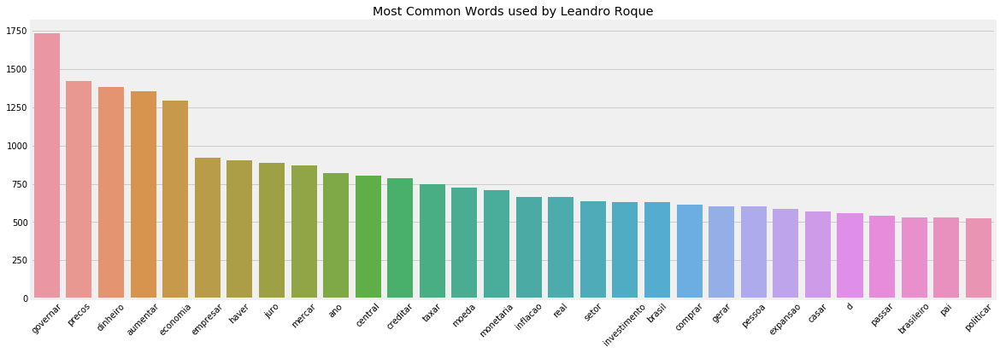

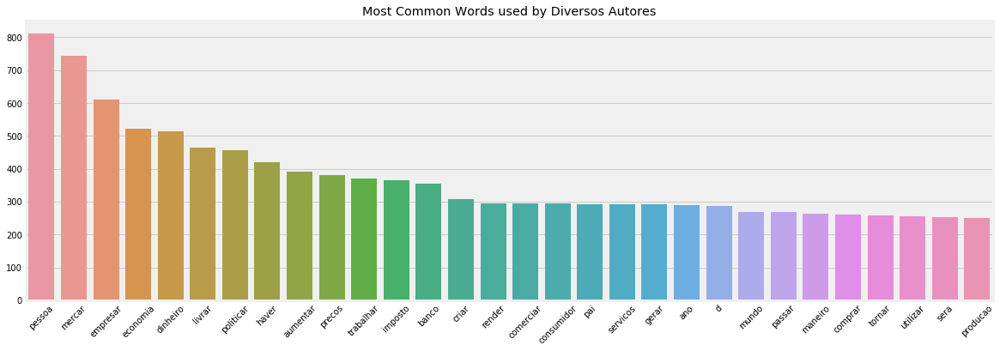

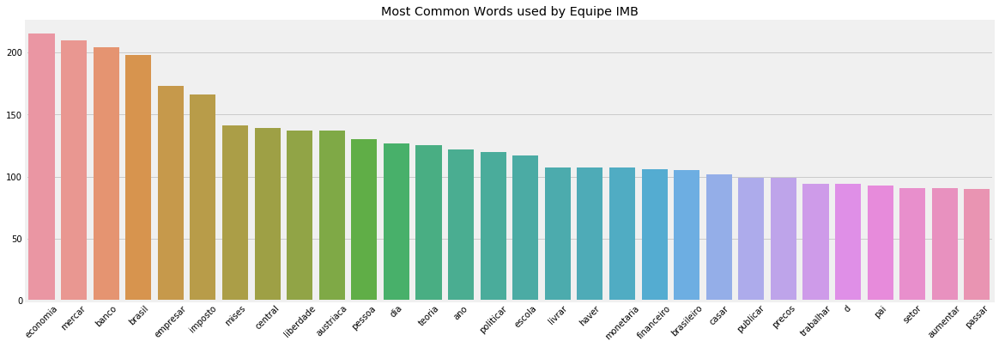

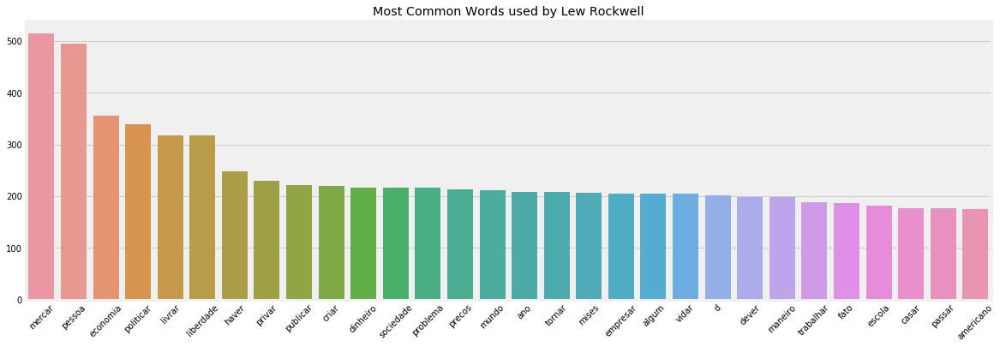

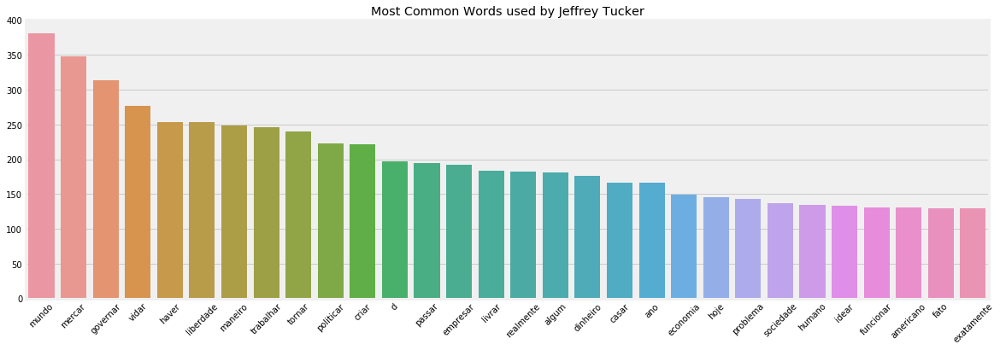

...

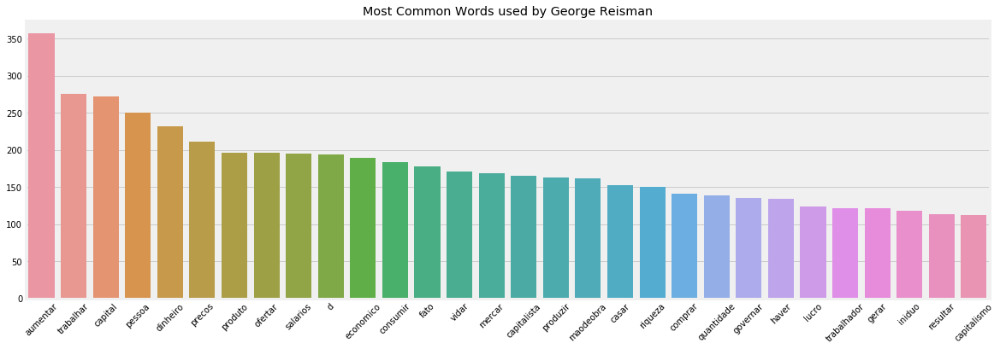

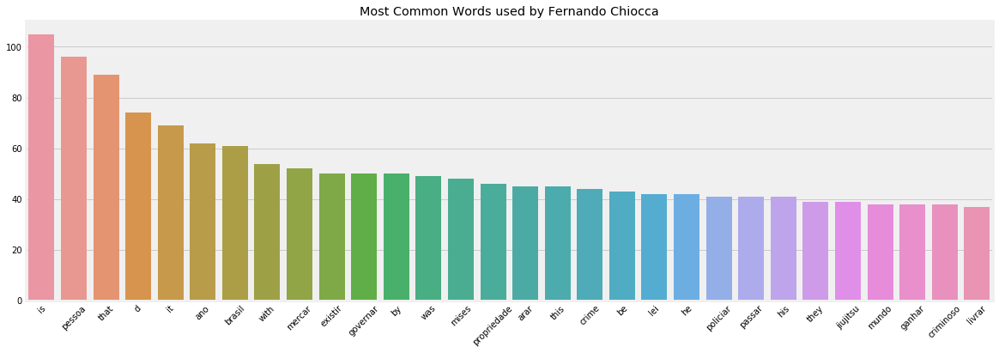

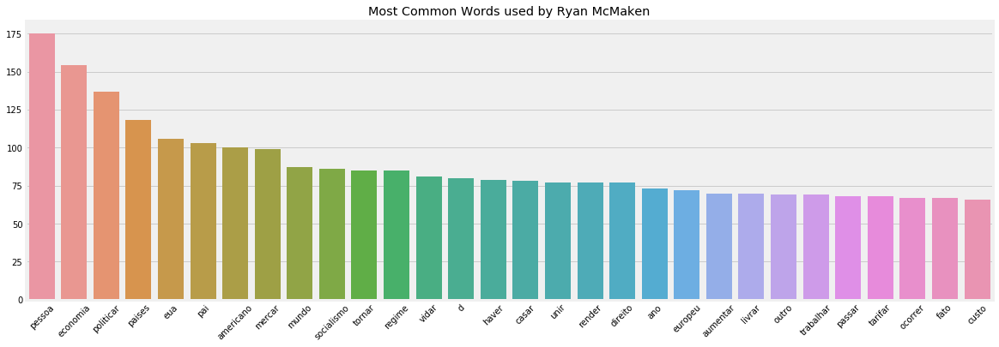

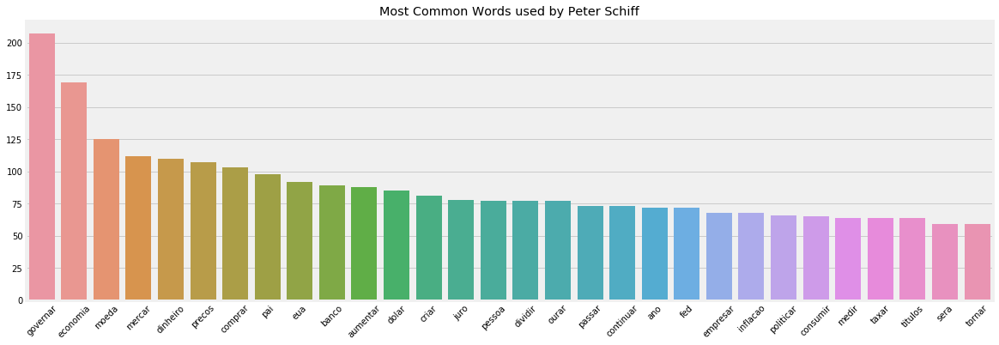

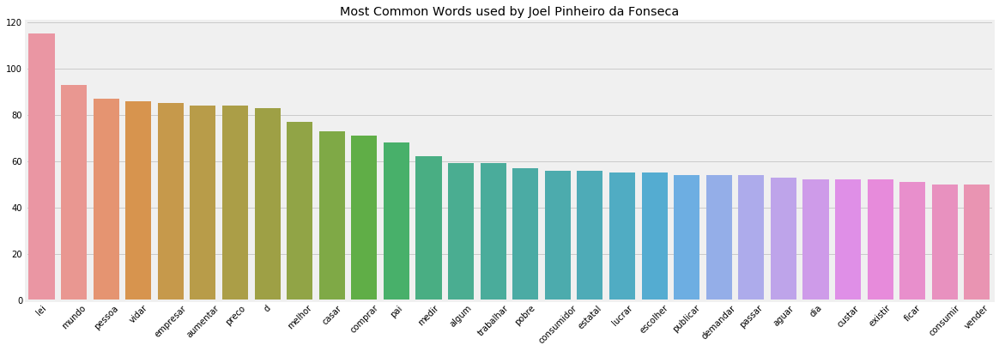

In [8]:
for profilic_author in profilic_authors['author']:
    get_word_frequency(df_extracted_essays, 'author', profilic_author)

In [9]:
# Word cloud with most common words
def show_wordcloud(text, author):
    # Create and generate a word cloud image:
    wordcloud = WordCloud(stopwords=stoplist, background_color="white").generate(text)

    # Display the generated image:
    fig = plt.figure(figsize=(25,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {author}', fontsize=20)
    plt.axis("off")
    plt.show()
    #fig.savefig(f'word_cloud_{author}.png', format='png', dpi=500)
    
def get_wordcloud(df, author):
    dataframe = df[df['author'] == author]
    # Get all texts and generate a cloud
    text = " ".join(review for review in dataframe.text_processed)
    show_wordcloud(text, author) 

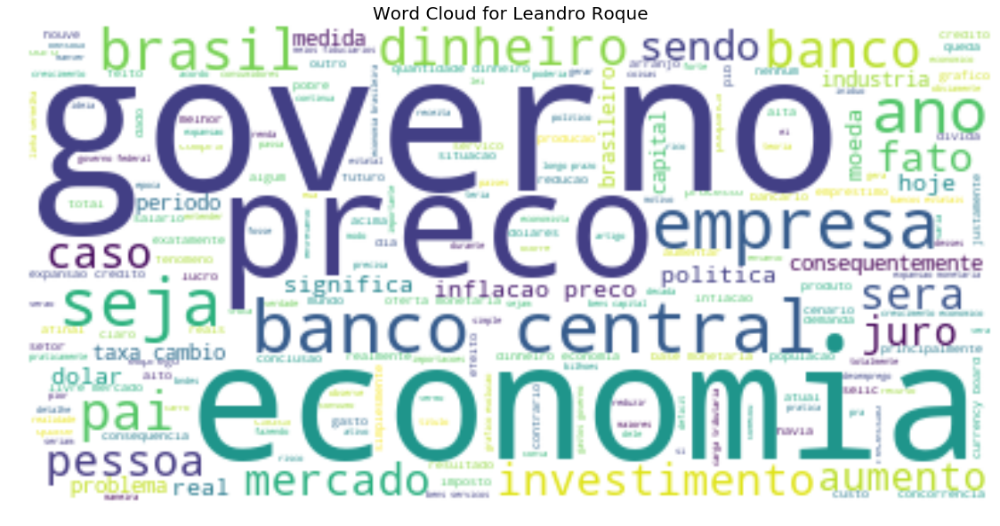

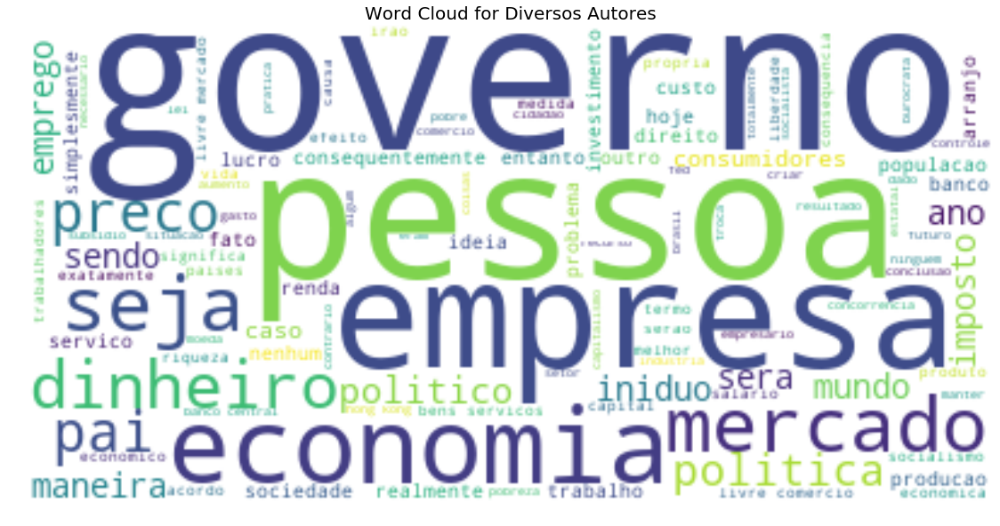

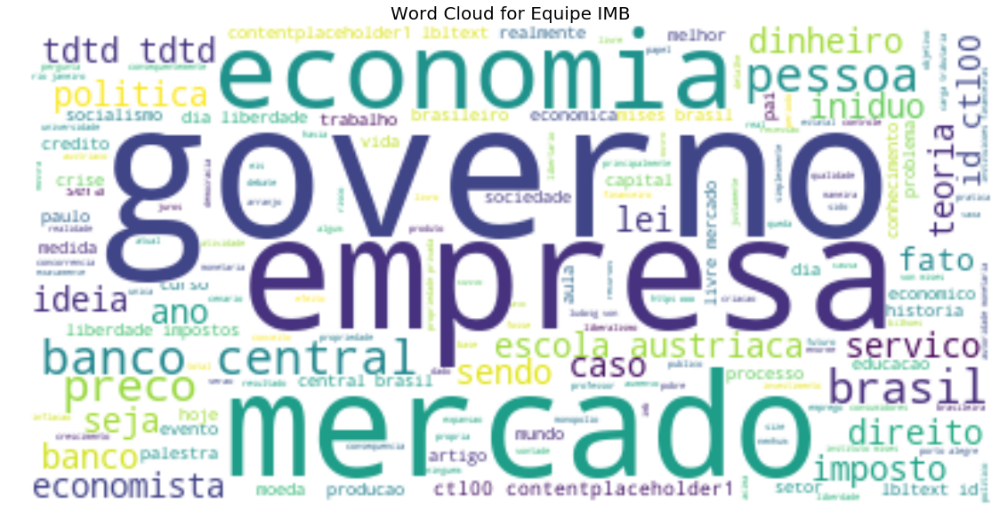

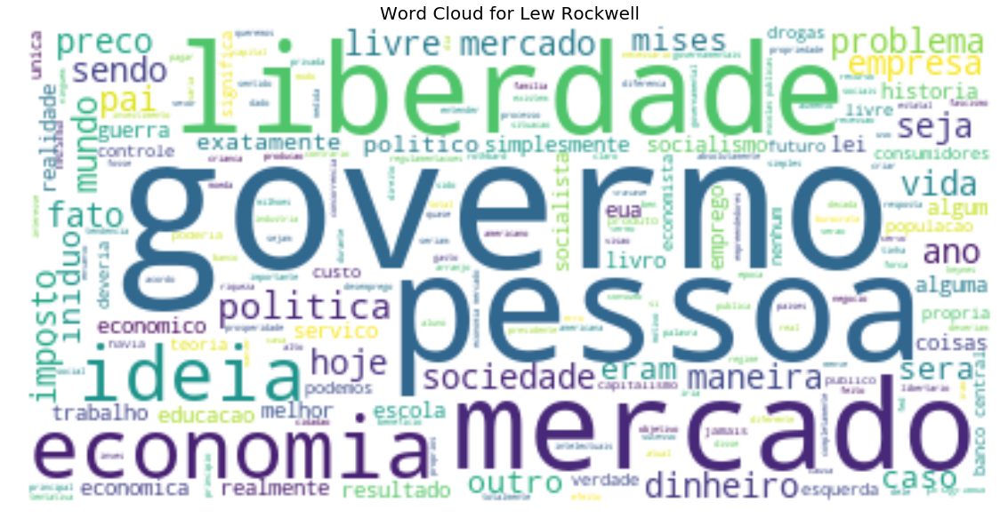

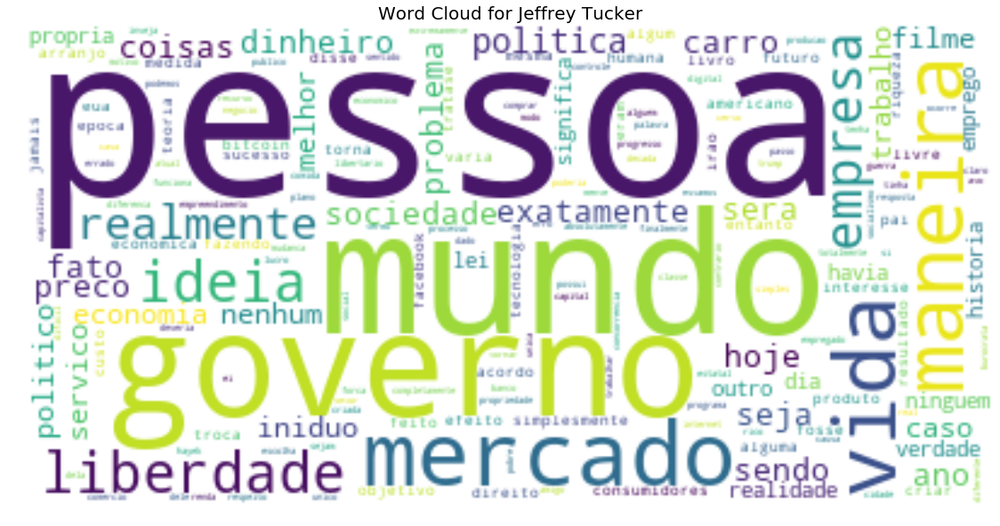

...

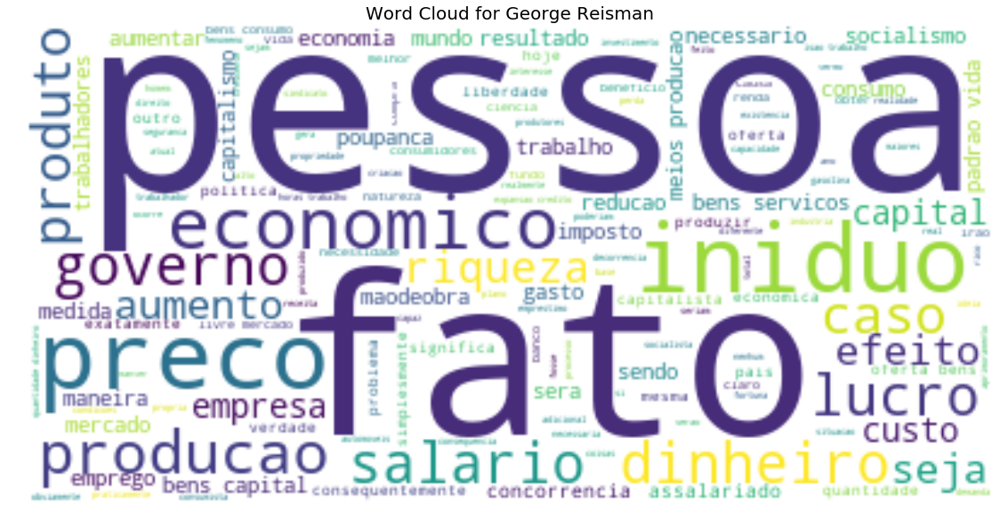

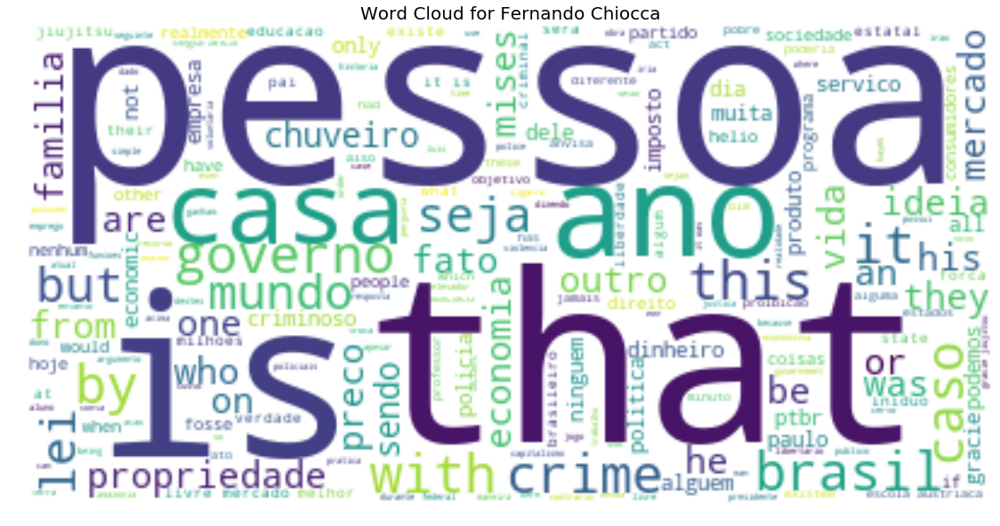

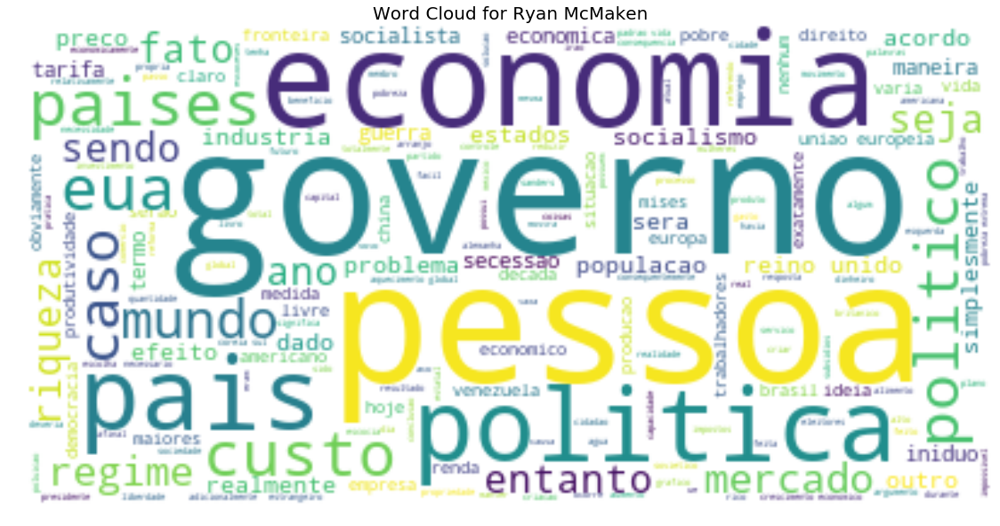

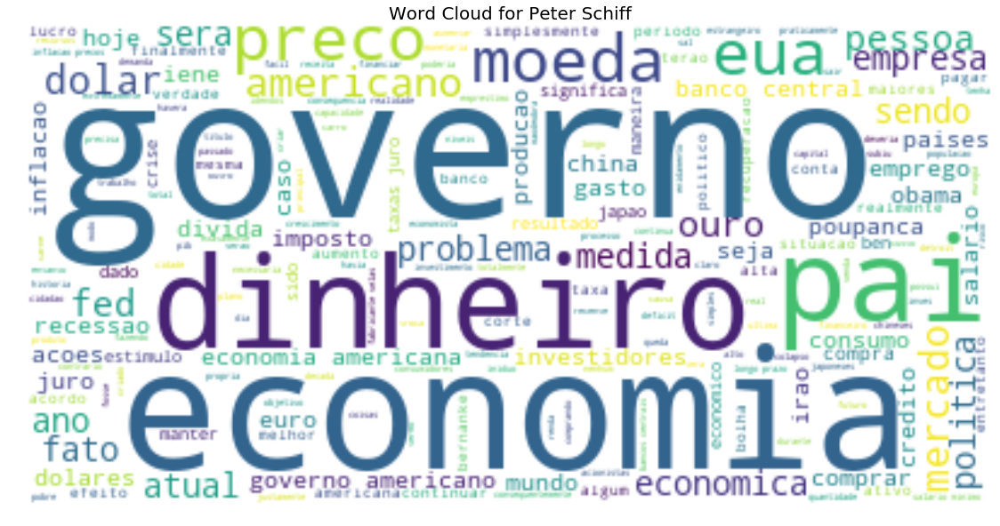

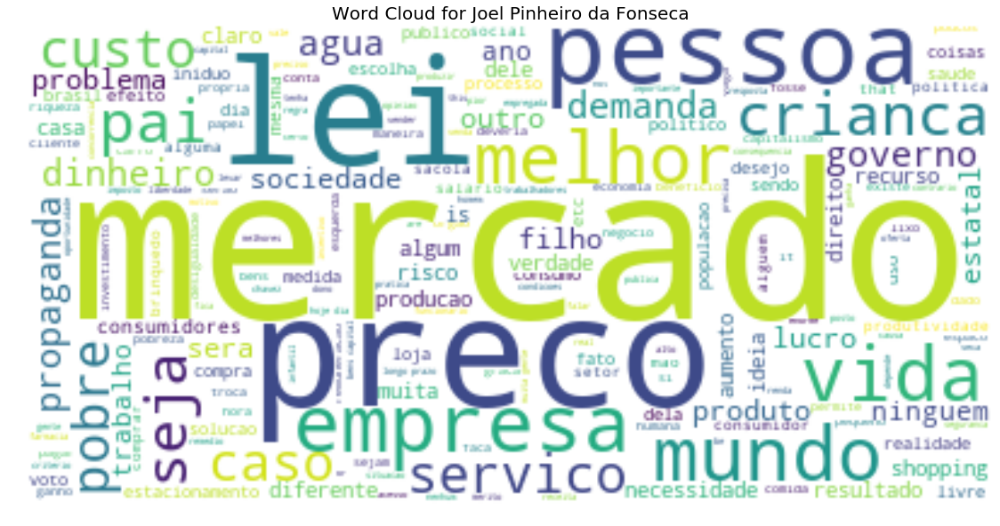

In [10]:
for profilic_author in profilic_authors['author']:
    get_wordcloud(df_extracted_essays, profilic_author)

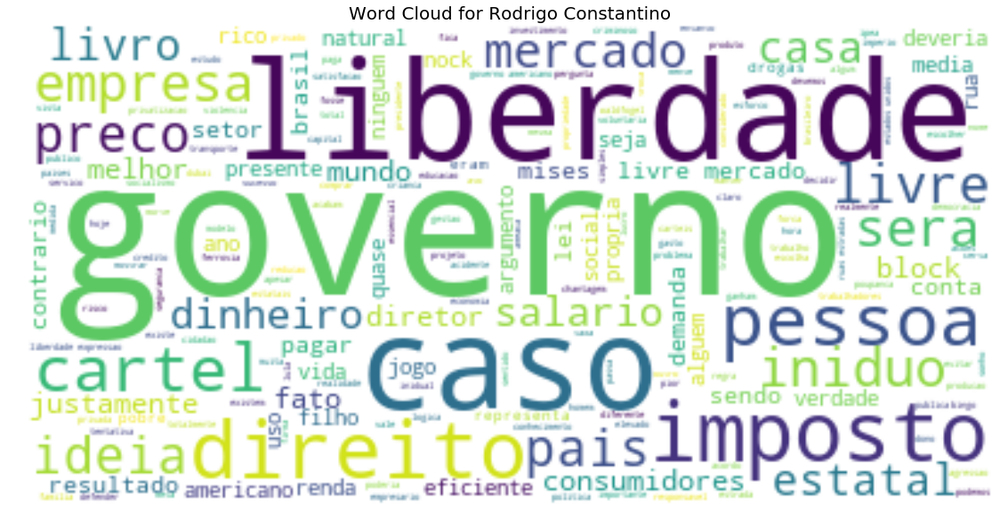

In [31]:
get_wordcloud(df_extracted_essays, 'Rodrigo Constantino')

In [11]:
# This one came from Analytics Vidhya
# Ref: https://www.analyticsvidhya.com/blog/2018/04/a-comprehensive-guide-to-understand-and-implement-text-classification-in-python/

# Generate the TF 
tf1 \
    = (df_extracted_essays['text_processed'][1:2])\
    .apply(lambda x: pd.value_counts(x.split(" ")))\
    .sum(axis = 0).reset_index()

tf1.columns = ['words','tf']

# Remove some instances with NaN
tf1 = tf1.dropna()
df_extracted_essays = df_extracted_essays.dropna()

# Calculate the log of the terms according to the TF
for i, word in enumerate(tf1['words']):
    tf1.loc[i, 'idf'] \
        = np.log(df_extracted_essays.shape[0]\
                 /(len(df_extracted_essays[df_extracted_essays['text_processed']\
                                           .str.contains(word)])))
    
# Full calculation of TF-IDF
tf1['tfidf'] = tf1['tf'] * tf1['idf']
tf1.head(30)

,words,tf,idf,tfidf
0,economia,11,0.459911,5.059025
1,alunos,10,3.114040,31.140401
2,professor,8,1.878294,15.026352
3,vida,8,0.236879,1.895029
4,maneira,7,0.574859,4.024013
5,apartamento,7,3.515576,24.609032
6,liberdade,7,0.959718,6.718023
7,anos,7,0.353333,2.473329
8,promover,7,2.606369,18.244583
9,mises,6,1.405719,8.434316


TF-IDF References
https://towardsdatascience.com/tfidf-for-piece-of-text-in-python-43feccaa74f8
https://iyzico.engineering/how-to-calculate-tf-idf-term-frequency-inverse-document-frequency-from-the-beatles-biography-in-c4c3cd968296
https://triton.ml/blog/tf-idf-from-scratch
https://towardsdatascience.com/tf-idf-for-document-ranking-from-scratch-in-python-on-real-world-dataset-796d339a4089

In [12]:
def get_tfidf_by_author(df, author):
    # Generate the TF
    tf1 \
        = (df[df['author'] == author]['text_processed'])\
    .apply(lambda x: pd.value_counts(x.split(" ")))\
    .sum(axis = 0).reset_index()
    tf1.columns = ['words','tf']

    # Remove some instances with NaN
    tf1 = tf1.dropna()
    df = df.dropna()

    # Calculate the log of the terms according to the TF
    for i, word in enumerate(tf1['words']):
        tf1.loc[i, 'idf'] \
            = np.log(df.shape[0]/(len(df[df['text_processed'].str.contains(word)])))

    # Full calculation of TF-IDF
    tf1['tfidf'] = tf1['tf'] * tf1['idf']
    tf1 = tf1.sort_values(by=['tfidf'], ascending=False).head(30)
    
    return tf1

In [13]:
get_tfidf_by_author(df_extracted_essays, 'Leandro Roque')

,words,tf,idf,tfidf
1453,selic,362.0,3.654162,1322.806680
406,juros,885.0,1.447969,1281.452434
955,cambio,500.0,2.432774,1216.387127
46,banco,1027.0,1.096516,1126.121780
111,credito,780.0,1.442034,1124.786611
8,precos,1423.0,0.788877,1122.572221
274,bancos,747.0,1.496759,1118.078985
3816,grafico,458.0,2.215224,1014.572594
5,monetaria,706.0,1.338154,944.736714
41,inflacao,665.0,1.385945,921.653192


In [14]:
get_tfidf_by_author(df_extracted_essays, 'Lew Rockwell')

,words,tf,idf,tfidf
5760,drogas,104.0,3.187543,331.504427
657,liberdade,303.0,0.959718,290.794418
68,mises,206.0,1.405719,289.578177
220,escolas,99.0,2.436766,241.239861
0,governo,695.0,0.309487,215.093745
1,mercado,488.0,0.390365,190.497918
116,sociedade,207.0,0.917691,189.961996
3388,educacao,94.0,2.007585,188.712956
381,esquerda,85.0,2.212024,188.022040
915,left,48.0,3.847353,184.672960


In [15]:
get_tfidf_by_author(df_extracted_essays, 'Jeffrey Tucker')

,words,tf,idf,tfidf
2485,filme,102.0,3.083030,314.469047
9074,bitcoin,59.0,4.347309,256.491248
2486,facebook,64.0,3.799344,243.158023
1065,liberdade,242.0,0.959718,232.251647
12189,obamacare,36.0,6.012317,216.443414
2487,zuckerberg,36.0,5.761003,207.396094
9,mundo,380.0,0.532869,202.490336
53,pessoas,547.0,0.356325,194.909902
11116,trump,48.0,3.987935,191.420893
2159,saude,92.0,1.885183,173.436805


In [16]:
get_tfidf_by_author(df_extracted_essays, 'Fernando Ulrich')

,words,tf,idf,tfidf
8753,bitcoin,241.0,4.347309,1047.701536
17,bancos,374.0,1.496759,559.787872
0,dubai,87.0,6.166468,536.482692
750,moeda,351.0,1.365183,479.179113
4169,banks,73.0,5.473321,399.552400
1957,cambio,140.0,2.432774,340.588395
3172,bacen,76.0,4.374708,332.477827
27,monetaria,248.0,1.338154,331.862188
4,credito,230.0,1.442034,331.667847
21,banco,290.0,1.096516,317.989597


In [17]:
get_tfidf_by_author(df_extracted_essays, 'Ludwig von Mises')

,words,tf,idf,tfidf
102,producao,497.0,0.970737,482.456262
390,socialismo,224.0,1.908494,427.502597
1538,homem,244.0,1.677831,409.390850
290,salarios,235.0,1.586615,372.854606
1556,capitalismo,206.0,1.692926,348.742752
4094,marx,144.0,2.237915,322.259820
468,condicoes,208.0,1.499889,311.976893
1107,homens,152.0,1.976813,300.475573
1264,lucros,187.0,1.588326,297.017001
256,trabalho,300.0,0.928254,278.476284


In [18]:
get_tfidf_by_author(df_extracted_essays, 'Ubiratan Jorge Iorio')

,words,tf,idf,tfidf
349,say,181.0,3.667768,663.865963
56,hayek,213.0,2.352425,501.066552
16,austriaca,228.0,1.934780,441.129749
0,moeda,292.0,1.365183,398.633336
6409,cantillon,77.0,4.962495,382.112109
2,teoria,312.0,1.162521,362.706682
388,juros,247.0,1.447969,357.648306
14,consumo,227.0,1.452443,329.704591
11,producao,326.0,0.970737,316.460244
8379,mariana,61.0,5.013788,305.841081


In [19]:
get_tfidf_by_author(df_extracted_essays, 'Gary North')

,words,tf,idf,tfidf
119,bancos,493.0,1.496759,737.902195
94,titulos,196.0,1.997222,391.455483
132,monetaria,265.0,1.338154,354.610806
78,banco,307.0,1.096516,336.630367
75,juros,219.0,1.447969,317.105179
0,dinheiro,474.0,0.657754,311.775575
61,centrais,144.0,2.052865,295.612610
280,moeda,198.0,1.365183,270.306166
1128,eleitores,91.0,2.901981,264.080306
586,governos,197.0,1.268628,249.919701


In [20]:
get_tfidf_by_author(df_extracted_essays, 'Murray N. Rothbard')

,words,tf,idf,tfidf
0,left,225.0,3.847353,865.654499
50,propriedade,384.0,1.220075,468.508684
5067,smith,145.0,3.075425,445.936664
1009,libertario,190.0,2.337826,444.187002
365,depressao,166.0,2.601641,431.872392
2475,ouro,296.0,1.442034,426.842098
741,libertarios,160.0,2.635217,421.634754
3,teoria,331.0,1.162521,384.794589
2681,enus,63.0,5.878786,370.363496
1786,dinheiro,552.0,0.657754,363.080417


In [21]:
get_tfidf_by_author(df_extracted_essays, 'Helio Beltrão')

,words,tf,idf,tfidf
5529,madoff,33.0,6.348789,209.510046
1884,that,36.0,3.768572,135.668608
68,beltrao,32.0,4.108080,131.458547
2415,internet,46.0,2.405268,110.642310
91,helio,25.0,4.006983,100.174587
2541,apaches,12.0,7.958227,95.498726
1140,brasil,91.0,1.022857,93.079964
6198,karnal,11.0,7.958227,87.540499
2540,equipe,27.0,3.213295,86.758967
7,isencao,17.0,5.013788,85.234400


In [22]:
get_tfidf_by_author(df_extracted_essays, 'Juan Ramón Rallo')

,words,tf,idf,tfidf
1944,piketty,48.0,5.319170,255.320153
96,divida,115.0,1.696736,195.124583
3809,pobreza,82.0,2.228127,182.706448
769,gastos,126.0,1.369301,172.531890
6264,bitcoin,38.0,4.347309,165.197753
1286,pib,77.0,2.117586,163.054086
219,impostos,147.0,1.044490,153.540007
440,capitalista,80.0,1.844545,147.563601
416,empresarios,74.0,1.961775,145.171358
1948,patrimonio,44.0,3.276096,144.148222


In [23]:
get_tfidf_by_author(df_extracted_essays, 'Hans-Hermann Hoppe')

,words,tf,idf,tfidf
25,propriedade,832.0,1.220075,1015.102149
1205,seguradoras,129.0,4.174038,538.450845
49,democracia,184.0,2.261134,416.048602
232,conflitos,144.0,2.828328,407.279301
1371,protecao,173.0,2.234642,386.593082
34,privada,238.0,1.241632,295.508516
543,rothbard,123.0,2.316320,284.907375
1363,bens,300.0,0.923839,277.151779
0,intelectuais,114.0,2.284904,260.479047
1613,agressao,85.0,3.023753,257.019027


In [24]:
get_tfidf_by_author(df_extracted_essays, 'Robert P. Murphy')

,words,tf,idf,tfidf
2022,krugman,159.0,3.627494,576.771522
2021,ilheus,70.0,7.265080,508.555601
6723,acme,34.0,7.958227,270.579725
4473,hayeks,32.0,7.958227,254.663270
8492,tmm,37.0,6.859615,253.805751
2,juros,172.0,1.447969,249.050643
2027,sushi,36.0,5.878786,211.636283
2028,rolinhos,29.0,6.859615,198.928832
278,titulos,94.0,1.997222,187.738854
12,austriaca,93.0,1.934780,179.934503


In [25]:
get_tfidf_by_author(df_extracted_essays, 'George Reisman')

,words,tf,idf,tfidf
4,producao,401.0,0.970737,389.265515
28,salarios,195.0,1.586615,309.389992
1612,maodeobra,162.0,1.908494,309.175985
9,bens,333.0,0.923839,307.638474
894,capitalistas,110.0,2.348755,258.363094
4441,producionista,30.0,7.958227,238.746816
128,produtos,167.0,1.346186,224.813088
892,assalariados,58.0,3.654162,211.941402
691,capital,272.0,0.745196,202.693185
18,oferta,183.0,1.096516,200.662401


In [26]:
get_tfidf_by_author(df_extracted_essays, 'Fernando Chiocca')

,words,tf,idf,tfidf
2436,that,89.0,3.768572,335.402948
6144,jiujitsu,39.0,7.265080,283.338120
6145,gracie,35.0,6.859615,240.086522
2457,with,54.0,3.915176,211.419500
2456,this,45.0,4.220558,189.925091
2447,they,39.0,4.402879,171.712286
4630,chuveiro,29.0,5.761003,167.069076
2730,was,49.0,3.179104,155.776081
950,ptbr,25.0,6.012317,150.307926
2439,by,50.0,2.765270,138.263517


In [27]:
get_tfidf_by_author(df_extracted_essays, 'Ryan McMaken')

,words,tf,idf,tfidf
175,secessao,48.0,4.108080,197.187820
5496,sanders,30.0,5.878786,176.363570
182,reino,62.0,2.793441,173.193356
674,socialismo,86.0,1.908494,164.130461
4729,trump,36.0,3.987935,143.565670
148,eua,106.0,1.306655,138.505464
1181,coreia,39.0,3.539387,138.036077
598,tarifas,59.0,2.302235,135.831888
30,estados,84.0,1.590040,133.563361
2387,venezuela,42.0,3.106197,130.460271


In [28]:
get_tfidf_by_author(df_extracted_essays, 'Peter Schiff')

,words,tf,idf,tfidf
463,americana,84.0,1.778211,149.369685
339,dolar,85.0,1.749637,148.719159
341,americanos,72.0,2.018056,145.300028
324,americano,99.0,1.359718,134.612098
1872,titulos,64.0,1.997222,127.822199
3021,precipicio,24.0,5.125014,123.000332
1171,moeda,90.0,1.365183,122.866439
318,eua,92.0,1.306655,120.212289
114,divida,68.0,1.696736,115.378015
131,juros,78.0,1.447969,112.941570


In [29]:
get_tfidf_by_author(df_extracted_essays, 'Joel Pinheiro da Fonseca')

,words,tf,idf,tfidf
0,estacionamento,26.0,4.524240,117.630240
3031,agua,53.0,2.174402,115.243307
1738,propaganda,43.0,2.659910,114.376123
2253,that,28.0,3.768572,105.520029
5203,sertao,14.0,6.859615,96.034609
2928,sacolas,15.0,6.166468,92.497016
5991,palmada,15.0,6.166468,92.497016
1203,criancas,35.0,2.596935,90.892726
3612,infantil,26.0,3.492319,90.800296
1687,voto,36.0,2.502906,90.104619


In [30]:
get_tfidf_by_author(df_extracted_essays, 'Rodrigo Constantino')

,words,tf,idf,tfidf
583,block,21.0,4.269348,89.656303
1819,nock,14.0,5.761003,80.654037
207,cartel,26.0,2.995383,77.879947
2263,waldfogel,8.0,7.958227,63.665818
262,liberdade,59.0,0.959718,56.623335
1004,ipea,10.0,5.473321,54.733205
1329,diretor,17.0,3.154206,53.621505
2532,sonho,15.0,2.974621,44.619309
2546,chantagem,8.0,5.560332,44.482655
2793,palmadas,6.0,7.265080,43.590480
